<a href="https://colab.research.google.com/github/NicosStarreveld/WorkshopCNNs/blob/main/teeth_seg_id_training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Teeth Segmentation & Identification — Training Notebook

This notebook runs the `teeth-seg-id` pipeline (https://github.com/RKronoXR/teeth-seg-id) in Google Colab: it clones the repo, installs dependencies, downloads and prepares the public **UFBA-425** dataset, runs a smoke test, trains a Torchvision Mask R-CNN model, evaluates it, and runs inference on a sample image.

**Before you start:**
- Go to `Runtime > Change runtime type` and select a **GPU** (T4 is fine for the smoke test; a bigger GPU / Colab Pro helps a lot for real training).
- Training is slow and Colab sessions time out / disconnect. Cell 3 mounts Google Drive so your checkpoints, logs, and the downloaded dataset survive a disconnect — strongly recommended if you plan to run more than the 1-epoch quickstart.
- This is an academic demo pipeline (v0.1.0), not a validated medical device.

## 1. Check the GPU

In [1]:
!nvidia-smi

Tue Jul 14 20:09:36 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   45C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## 2. (Recommended) Mount Google Drive

This keeps the dataset and your trained checkpoints even if the Colab runtime disconnects. If you'd rather not use Drive, skip this cell — everything will just live on the temporary Colab disk and disappear when the runtime resets.

In [2]:
USE_DRIVE = False  # set to False to skip Google Drive and use local Colab storage only

import os

if USE_DRIVE:
    from google.colab import drive
    drive.mount('/content/drive')
    PROJECT_ROOT = '/content/drive/MyDrive/teeth-seg-id'
else:
    PROJECT_ROOT = '/content/teeth-seg-id'

print('Project root:', PROJECT_ROOT)

Project root: /content/teeth-seg-id


## 3. Clone the repository

In [3]:
import os

if not os.path.isdir(PROJECT_ROOT):
    parent = os.path.dirname(PROJECT_ROOT)
    os.makedirs(parent, exist_ok=True)
    !git clone https://github.com/RKronoXR/teeth-seg-id.git "{PROJECT_ROOT}"
else:
    print('Repo already present at', PROJECT_ROOT)

%cd "{PROJECT_ROOT}"
!git status

Cloning into '/content/teeth-seg-id'...
remote: Enumerating objects: 288, done.
remote: Counting objects: 100% (64/64), done.
remote: Compressing objects: 100% (48/48), done.
remote: Total 288 (delta 29), reused 50 (delta 16), pack-reused 224 (from 1)
Receiving objects: 100% (288/288), 163.35 KiB | 18.15 MiB/s, done.
Resolving deltas: 100% (139/139), done.
/content/teeth-seg-id
On branch main
Your branch is up to date with 'origin/main'.

nothing to commit, working tree clean


## 4. Install dependencies

Colab already ships with a CUDA-enabled PyTorch build, so instead of installing the repo's `torch-cu130.txt` (which targets CUDA 13.0 and may not match Colab's runtime), we install the rest of the base requirements and only reinstall torch/torchvision if needed. This cell also installs `plotly`, which the README notes is required but missing from `requirements/base.txt`.

In [4]:
%cd "{PROJECT_ROOT}"

!python -m pip install --upgrade pip -q
!python -m pip install -r requirements/base.txt -q
!python -m pip install "plotly==6.8.0" -q

# Check whether Colab's preinstalled torch already has CUDA available.
# If not, fall back to the repo's CUDA wheel file.
import torch
print('torch', torch.__version__, '| CUDA available:', torch.cuda.is_available())

if not torch.cuda.is_available():
    print('Falling back to requirements/torch-cu130.txt ...')
    !python -m pip install -r requirements/torch-cu130.txt -q

/content/teeth-seg-id
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 68.7 MB/s eta 0:00:00
torch 2.11.0+cu128 | CUDA available: True


In [5]:
!python -m pip check
!python -c "import torch, torchvision, streamlit, plotly, pycocotools; print('Imports OK')"

ipython 7.34.0 requires jedi, which is not installed.
Imports OK


## 5. Verify PyTorch, CUDA, and Mask R-CNN

In [6]:
%cd "{PROJECT_ROOT}"
%env PYTHONPATH=src
!PYTHONPATH=src python scripts/check_torch_gpu.py
!PYTHONPATH=src python scripts/check_torchvision_maskrcnn.py

/content/teeth-seg-id
env: PYTHONPATH=src
torch: 2.11.0+cu128
cuda available: True
cuda: 12.8
device: Tesla T4
gpu tensor test: torch.Size([1024, 1024])
torch: 2.11.0+cu128
torchvision: 0.26.0+cu128
cuda: True
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100% 97.8M/97.8M [00:00<00:00, 198MB/s]
Mask R-CNN baseline OK


## 6. Download and prepare the UFBA-425 dataset

This downloads the public dataset from Figshare (no credentials needed), extracts it, summarizes it, creates train/val/test splits, converts the masks to COCO JSON, and verifies the dataset loader. This can take a while the first time — with Drive mounted, you only need to do it once.

In [11]:
%cd "{PROJECT_ROOT}"

import os
coco_dir = 'data/processed/UFBA-425/coco'

if os.path.isdir(coco_dir) and os.listdir(coco_dir):
    print('COCO files already exist, skipping data prep. Delete the data/ folder to force a re-run.')
else:
    !PYTHONPATH=src python scripts/download_ufba425.py
    !PYTHONPATH=src python scripts/extract_ufba425.py
    !PYTHONPATH=src python scripts/summarize_ufba425.py
    !PYTHONPATH=src python scripts/create_ufba425_splits.py
    !PYTHONPATH=src python scripts/convert_ufba425_to_coco.py

!PYTHONPATH=src python scripts/check_dataset_loader.py

/content/teeth-seg-id
Files found: 7
Downloading: numbering_xrays.zip
Downloading: .DS_Store
Downloading: boundinng_boxes.zip
Downloading: polygon_masks.zip
Downloading: segmentation_xrays.zip
Downloading: README.md
Downloading: metadata.csv
Manifest saved: data/raw/UFBA-425/figshare_files_manifest.json
Extracting boundinng_boxes.zip -> data/interim/UFBA-425/boundinng_boxes
Extracting numbering_xrays.zip -> data/interim/UFBA-425/numbering_xrays
Extracting polygon_masks.zip -> data/interim/UFBA-425/polygon_masks
Extracting segmentation_xrays.zip -> data/interim/UFBA-425/segmentation_xrays
Done
{
  "metadata_rows": 425,
  "numbering_images": 425,
  "segmentation_images": 425,
  "bbox_files": 425,
  "polygon_masks": 11786,
  "tooth_count_min": 1,
  "tooth_count_max": 32,
  "tooth_count_mean": 27.235294117647058,
  "bbox_counts_by_fdi": {
    "11": 377,
    "12": 376,
    "13": 380,
    "14": 355,
    "15": 354,
    "16": 352,
    "17": 380,
    "18": 296,
    "21": 379,
    "22": 372,
   

## 7. Smoke test

One forward/backward pass to confirm the whole pipeline works before committing to a long training run.

In [12]:
%cd "{PROJECT_ROOT}"
!PYTHONPATH=src python scripts/smoke_train_maskrcnn.py

/content/teeth-seg-id
loading annotations into memory...
Done (t=0.06s)
creating index...
index created!
device: cuda
losses: {'loss_classifier': 3.9851229190826416, 'loss_box_reg': 0.2033948004245758, 'loss_mask': 3.286386728286743, 'loss_objectness': 0.6962741017341614, 'loss_rpn_box_reg': 0.5070265531539917}
total_loss: 8.678204536437988
Smoke training OK


## 8. Train

Set the parameters below, then run the cell. `train_maskrcnn_val_ap.py` is the README's recommended standard training script (validation-driven best-checkpoint selection, no augmentation). Colab can disconnect on long jobs, so this is launched as a background process (like the README's `nohup` example) and logs to a file you can tail in the next cell. `--resume` lets you continue an interrupted run using the same `RUN_NAME`.

Start small (e.g. a handful of epochs) to see it work end-to-end before committing to the full 300-epoch run from the README.

In [13]:
import os, time

%cd "{PROJECT_ROOT}"
os.makedirs('outputs/logs', exist_ok=True)

# ---- training settings: edit these ----
EPOCHS = 20
BATCH_SIZE = 4          # reduce if you hit CUDA out of memory
LR = 0.0002
VAL_EVERY = 5
EARLY_STOP_PATIENCE = 5
SAVE_EVERY = 5
RESUME_CHECKPOINT = ''   # e.g. 'outputs/checkpoints/<RUN_NAME>/epoch_10.pth' to resume, else leave blank
RUN_NAME = f"maskrcnn_colab_{time.strftime('%Y%m%d_%H%M%S')}"
# ----------------------------------------

os.environ['RUN_NAME'] = RUN_NAME
print('RUN_NAME:', RUN_NAME)

resume_flag = f'--resume "{RESUME_CHECKPOINT}"' if RESUME_CHECKPOINT else ''

cmd = (
    f'PYTHONPATH=src nohup python scripts/train_maskrcnn_val_ap.py '
    f'--epochs {EPOCHS} --batch-size {BATCH_SIZE} --lr {LR} '
    f'--run-name "{RUN_NAME}" --val-every {VAL_EVERY} '
    f'--early-stop-patience {EARLY_STOP_PATIENCE} --save-every {SAVE_EVERY} {resume_flag} '
    f'> "outputs/logs/{RUN_NAME}_terminal.log" 2>&1 &'
)
print(cmd)
get_ipython().system(cmd)
print('Training launched in the background. Use the next cell to follow progress.')

/content/teeth-seg-id
RUN_NAME: maskrcnn_colab_20260714_201535
PYTHONPATH=src nohup python scripts/train_maskrcnn_val_ap.py --epochs 20 --batch-size 4 --lr 0.0002 --run-name "maskrcnn_colab_20260714_201535" --val-every 5 --early-stop-patience 5 --save-every 5  > "outputs/logs/maskrcnn_colab_20260714_201535_terminal.log" 2>&1 &
Training launched in the background. Use the next cell to follow progress.


### Monitor training

Run this cell any time to check progress. Interrupt it (stop the cell) to stop watching — this does **not** stop training, which keeps running in the background.

In [14]:
%cd "{PROJECT_ROOT}"
!pgrep -af "train_maskrcnn" || echo 'No training process currently running.'
print('---')
!tail -n 40 "outputs/logs/{RUN_NAME}_terminal.log"

/content/teeth-seg-id
4091 python3 scripts/train_maskrcnn_val_ap.py --epochs 20 --batch-size 4 --lr 0.0002 --run-name maskrcnn_colab_20260714_201535 --val-every 5 --early-stop-patience 5 --save-every 5
4305 /bin/bash -c pgrep -af "train_maskrcnn" || echo 'No training process currently running.'
---
loading annotations into memory...
Done (t=0.06s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Epoch 1/20:  43%|████▎     | 32/75 [00:42<00:57,  1.33s/it, loss=2.6]

In [ ]:
# Optional: keep re-running this cell to live-tail the log (Colab doesn't support `tail -f` well across cells,
# so this polls instead). Interrupt the cell (square stop button) when you're done watching.
import time, os

log_path = f"outputs/logs/{RUN_NAME}_terminal.log"
seen = 0
try:
    while True:
        if os.path.exists(log_path):
            with open(log_path) as f:
                f.seek(seen)
                new = f.read()
                if new:
                    print(new, end='')
                    seen = f.tell()
        time.sleep(10)
except KeyboardInterrupt:
    print('\nStopped watching (training keeps running in the background).')

loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!

Epoch 1/20: 100%|██████████| 75/75 [01:40<00:00,  1.34s/it, loss=2.74]
Epoch 1 mean loss: 2.7942

Epoch 2/20: 100%|██████████| 75/75 [01:52<00:00,  1.50s/it, loss=1.34]
Epoch 2 mean loss: 1.7122

Epoch 3/20: 100%|██████████| 75/75 [01:52<00:00,  1.49s/it, loss=1.49]
Epoch 3 mean loss: 1.4037

Epoch 4/20: 100%|██████████| 75/75 [01:52<00:00,  1.50s/it, loss=1.12]
Epoch 4 mean loss: 1.2210

Epoch 5/20: 100%|██████████| 75/75 [01:52<00:00,  1.50s/it, loss=0.969]
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
New best model at epoch 5: val mask AP=0.5328
Periodic checkpoint saved: outputs/checkpoints/maskrcnn_colab_20260714_094015/epoch_5.pth
Epoch 5 mean loss: 1.0986
Val bbox AP=0.4762 | Val mask AP=0.5328 | Best epoch=5
Early stopping counter: 0/5

Epoch 6/20: 100%|██████████| 75/75 [01:53<

### Check training results

In [15]:
%cd "{PROJECT_ROOT}"
!find "outputs/checkpoints/{RUN_NAME}" -maxdepth 1 -type f -printf '%f\n' 2>/dev/null | sort
print('---')
!cat "outputs/checkpoints/{RUN_NAME}/best_model_info.json" 2>/dev/null || echo 'best_model.pth not created yet — training may still be running.'

/content/teeth-seg-id
---
best_model.pth not created yet — training may still be running.


## 9. Evaluate on the test split

Only run this once training has produced `best_model.pth` for `RUN_NAME`.

In [16]:
%cd "{PROJECT_ROOT}"
import os
os.makedirs('outputs/reports', exist_ok=True)

!PYTHONPATH=src python scripts/evaluate_maskrcnn_coco.py \
  --split test \
  --max-images 0 \
  --checkpoint "outputs/checkpoints/{RUN_NAME}/best_model.pth" \
  | tee "outputs/reports/eval_{RUN_NAME}_test.txt"

/content/teeth-seg-id
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Traceback (most recent call last):
  File "/content/teeth-seg-id/scripts/evaluate_maskrcnn_coco.py", line 99, in <module>
    main()
  File "/content/teeth-seg-id/scripts/evaluate_maskrcnn_coco.py", line 48, in main
    checkpoint = torch.load(args.checkpoint, map_location=device)
                 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/serialization.py", line 1530, in load
    with _open_file_like(f, "rb") as opened_file:
         ^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/serialization.py", line 795, in _open_file_like
    return _open_file(name_or_buffer, mode)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/serialization.py", line 776, in __init__
    super().__init__(open(name, mode))  # noqa: SIM115
                     ^^^^^^^^^^

## 10. Run inference on a sample image

Uses the first image from the dataset by default. To use your own image instead, run the upload cell below it first, then re-run this cell with `SAMPLE_IMAGE` set to the uploaded path.

In [47]:
%cd "{PROJECT_ROOT}"
import glob

candidates = sorted(glob.glob('data/interim/UFBA-425/numbering_xrays/numbering_xrays/*.jpg'))
SAMPLE_IMAGE = candidates[0] if candidates else ''
print('Using image:', SAMPLE_IMAGE)

!PYTHONPATH=src python scripts/infer_panoramic_export.py \
  --image "{SAMPLE_IMAGE}" \
  --checkpoint "outputs/checkpoints/{RUN_NAME}/best_model.pth" \
  --output-dir outputs/predictions/quickstart \
  --keep-best-per-fdi \
  --show-scores

/content/teeth-seg-id
Using image: data/interim/UFBA-425/numbering_xrays/numbering_xrays/cate1-00002_jpg.rf.e0c956c6468ef96b53c862916e6fb6e8.jpg
Image: data/interim/UFBA-425/numbering_xrays/numbering_xrays/cate1-00002_jpg.rf.e0c956c6468ef96b53c862916e6fb6e8.jpg
Predictions kept: 31
Saved overlay: outputs/predictions/quickstart/cate1-00002_jpg.rf.e0c956c6468ef96b53c862916e6fb6e8/cate1-00002_jpg.rf.e0c956c6468ef96b53c862916e6fb6e8_clahe_thr0.65_display_original_prediction.png
Saved JSON: outputs/predictions/quickstart/cate1-00002_jpg.rf.e0c956c6468ef96b53c862916e6fb6e8/cate1-00002_jpg.rf.e0c956c6468ef96b53c862916e6fb6e8_clahe_thr0.65_display_original_prediction.json
Saved CSV: outputs/predictions/quickstart/cate1-00002_jpg.rf.e0c956c6468ef96b53c862916e6fb6e8/cate1-00002_jpg.rf.e0c956c6468ef96b53c862916e6fb6e8_clahe_thr0.65_display_original_prediction.csv
Saved report: outputs/predictions/quickstart/cate1-00002_jpg.rf.e0c956c6468ef96b53c862916e6fb6e8/cate1-00002_jpg.rf.e0c956c6468ef96b53c

In [44]:
!ls -la "outputs/checkpoints/{RUN_NAME}/"

total 2589008
drwxr-xr-x 2 root root      4096 Jul 14 20:53 .
drwxr-xr-x 3 root root      4096 Jul 14 20:15 ..
-rw-r--r-- 1 root root       299 Jul 14 20:44 best_model_info.json
-rw-r--r-- 1 root root 530221844 Jul 14 20:44 best_model.pth
-rw-r--r-- 1 root root 530219906 Jul 14 20:34 epoch_10.pth
-rw-r--r-- 1 root root 530219906 Jul 14 20:44 epoch_15.pth
-rw-r--r-- 1 root root 530219906 Jul 14 20:53 epoch_20.pth
-rw-r--r-- 1 root root 530218425 Jul 14 20:25 epoch_5.pth


In [48]:
!cat "outputs/logs/{RUN_NAME}_terminal.log"

loading annotations into memory...
Done (t=0.06s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Epoch 1/20: 100%|██████████| 75/75 [01:42<00:00,  1.37s/it, loss=2.28]
Epoch 1 mean loss: 2.6798
Epoch 2/20: 100%|██████████| 75/75 [01:48<00:00,  1.45s/it, loss=1.44]
Epoch 2 mean loss: 1.6460
Epoch 3/20: 100%|██████████| 75/75 [01:48<00:00,  1.45s/it, loss=1.57]
Epoch 3 mean loss: 1.3746
Epoch 4/20: 100%|██████████| 75/75 [01:48<00:00,  1.45s/it, loss=1.2]
Epoch 4 mean loss: 1.1805
Epoch 5/20: 100%|██████████| 75/75 [01:48<00:00,  1.45s/it, loss=0.921]
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
New best model at epoch 5: val mask AP=0.5404
Periodic checkpoint saved: outputs/checkpoints/maskrcnn_colab_20260714_201535/epoch_5.pth
Epoch 5 mean loss: 1.0666
Val bbox AP=0.4753 | Val mask AP=0.5404 | Best epoch=5
Early stopping counter: 0/5
Epoch 6/20: 100%|██████████| 75/75 [01:49<00:00, 

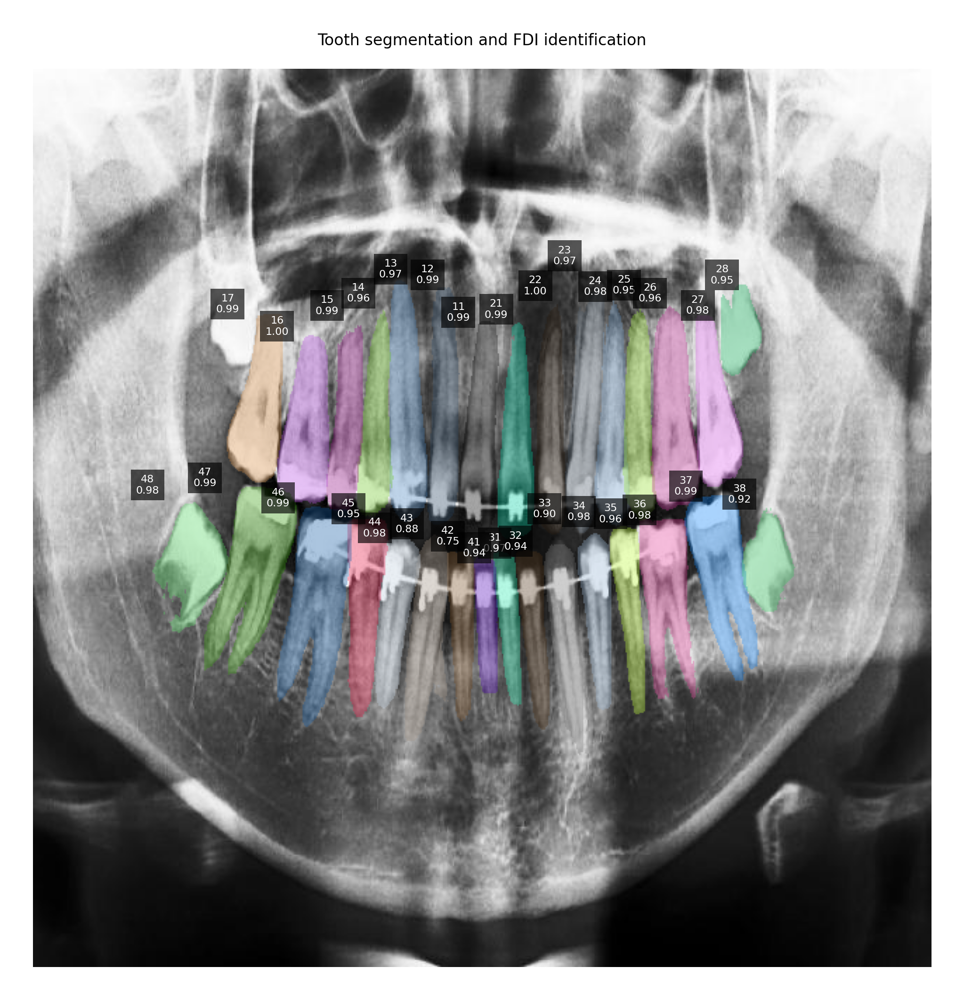

In [49]:
from IPython.display import Image, display
import glob

preds = sorted(glob.glob('outputs/predictions/quickstart/**/*_prediction.png', recursive=True))
if preds:
    display(Image(filename=preds[-1]))
else:
    print('No prediction image found yet.')

### (Optional) Upload your own panoramic image for inference

Saving 14071.jpg to 14071 (2).jpg
Saving 14072.jpg to 14072 (2).jpg
Saving 14073.jpg to 14073 (2).jpg
Saving 14074.jpg to 14074 (2).jpg
Saving 14075.jpg to 14075 (2).jpg
Saving 14076.jpg to 14076 (2).jpg

=== Running inference on 14071 (2).jpg ===
Image: 14071 (2).jpg
Predictions kept: 0
Saved overlay: outputs/predictions/uploaded/14071 (2)/14071 (2)/14071 (2)_clahe_thr0.65_display_original_prediction.png
Saved JSON: outputs/predictions/uploaded/14071 (2)/14071 (2)/14071 (2)_clahe_thr0.65_display_original_prediction.json
Saved CSV: outputs/predictions/uploaded/14071 (2)/14071 (2)/14071 (2)_clahe_thr0.65_display_original_prediction.csv
Saved report: outputs/predictions/uploaded/14071 (2)/14071 (2)/14071 (2)_clahe_thr0.65_display_original_report.md
Saved masks: outputs/predictions/uploaded/14071 (2)/14071 (2)/masks


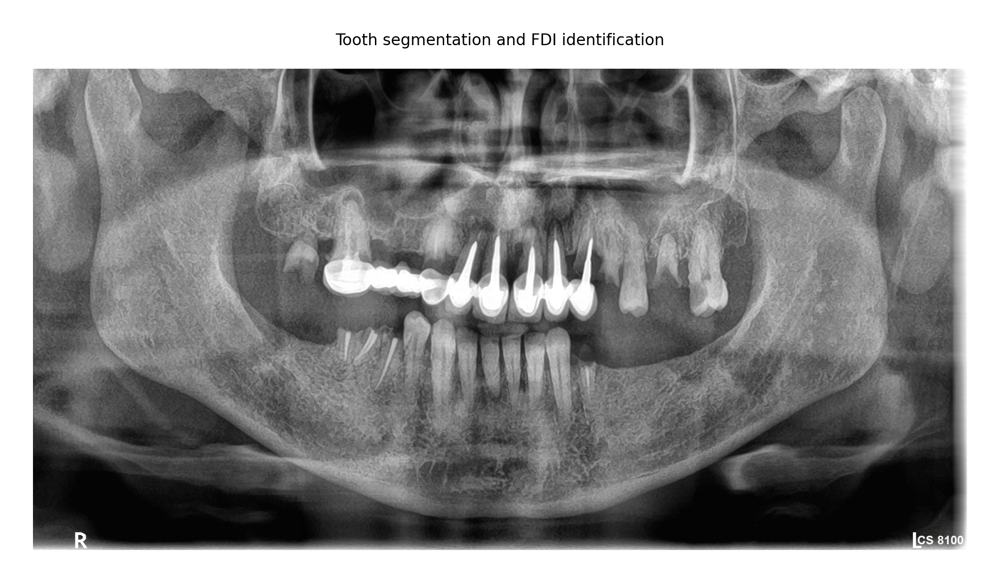


=== Running inference on 14072 (2).jpg ===
Image: 14072 (2).jpg
Predictions kept: 3
Saved overlay: outputs/predictions/uploaded/14072 (2)/14072 (2)/14072 (2)_clahe_thr0.65_display_original_prediction.png
Saved JSON: outputs/predictions/uploaded/14072 (2)/14072 (2)/14072 (2)_clahe_thr0.65_display_original_prediction.json
Saved CSV: outputs/predictions/uploaded/14072 (2)/14072 (2)/14072 (2)_clahe_thr0.65_display_original_prediction.csv
Saved report: outputs/predictions/uploaded/14072 (2)/14072 (2)/14072 (2)_clahe_thr0.65_display_original_report.md
Saved masks: outputs/predictions/uploaded/14072 (2)/14072 (2)/masks


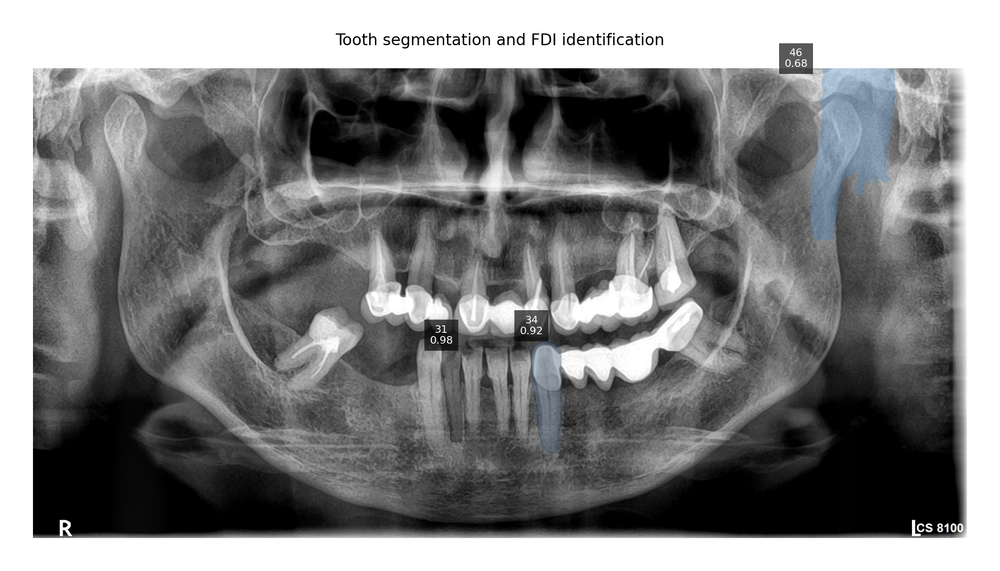


=== Running inference on 14073 (2).jpg ===
Image: 14073 (2).jpg
Predictions kept: 1
Saved overlay: outputs/predictions/uploaded/14073 (2)/14073 (2)/14073 (2)_clahe_thr0.65_display_original_prediction.png
Saved JSON: outputs/predictions/uploaded/14073 (2)/14073 (2)/14073 (2)_clahe_thr0.65_display_original_prediction.json
Saved CSV: outputs/predictions/uploaded/14073 (2)/14073 (2)/14073 (2)_clahe_thr0.65_display_original_prediction.csv
Saved report: outputs/predictions/uploaded/14073 (2)/14073 (2)/14073 (2)_clahe_thr0.65_display_original_report.md
Saved masks: outputs/predictions/uploaded/14073 (2)/14073 (2)/masks


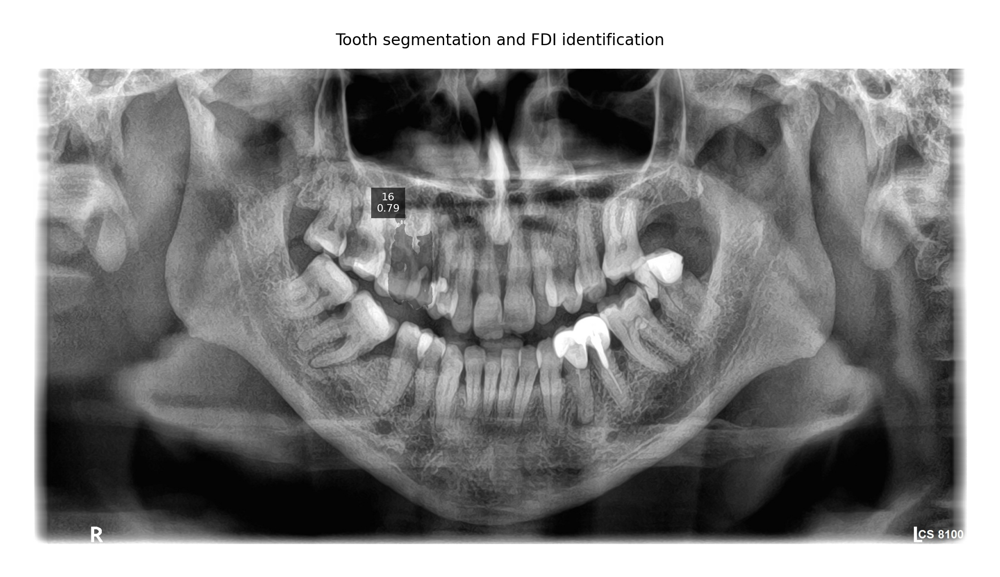


=== Running inference on 14074 (2).jpg ===
Image: 14074 (2).jpg
Predictions kept: 14
Saved overlay: outputs/predictions/uploaded/14074 (2)/14074 (2)/14074 (2)_clahe_thr0.65_display_original_prediction.png
Saved JSON: outputs/predictions/uploaded/14074 (2)/14074 (2)/14074 (2)_clahe_thr0.65_display_original_prediction.json
Saved CSV: outputs/predictions/uploaded/14074 (2)/14074 (2)/14074 (2)_clahe_thr0.65_display_original_prediction.csv
Saved report: outputs/predictions/uploaded/14074 (2)/14074 (2)/14074 (2)_clahe_thr0.65_display_original_report.md
Saved masks: outputs/predictions/uploaded/14074 (2)/14074 (2)/masks


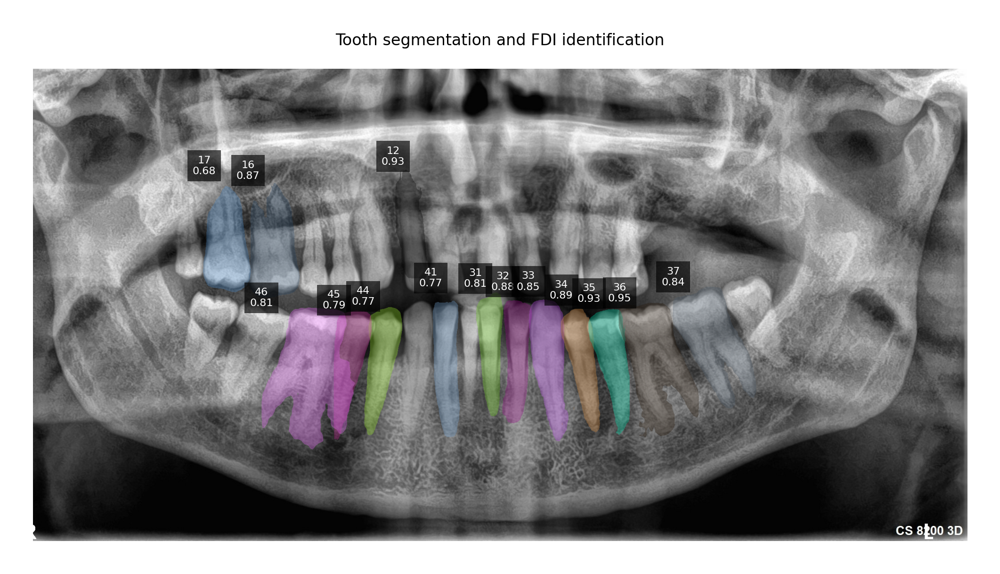


=== Running inference on 14075 (2).jpg ===
Image: 14075 (2).jpg
Predictions kept: 7
Saved overlay: outputs/predictions/uploaded/14075 (2)/14075 (2)/14075 (2)_clahe_thr0.65_display_original_prediction.png
Saved JSON: outputs/predictions/uploaded/14075 (2)/14075 (2)/14075 (2)_clahe_thr0.65_display_original_prediction.json
Saved CSV: outputs/predictions/uploaded/14075 (2)/14075 (2)/14075 (2)_clahe_thr0.65_display_original_prediction.csv
Saved report: outputs/predictions/uploaded/14075 (2)/14075 (2)/14075 (2)_clahe_thr0.65_display_original_report.md
Saved masks: outputs/predictions/uploaded/14075 (2)/14075 (2)/masks


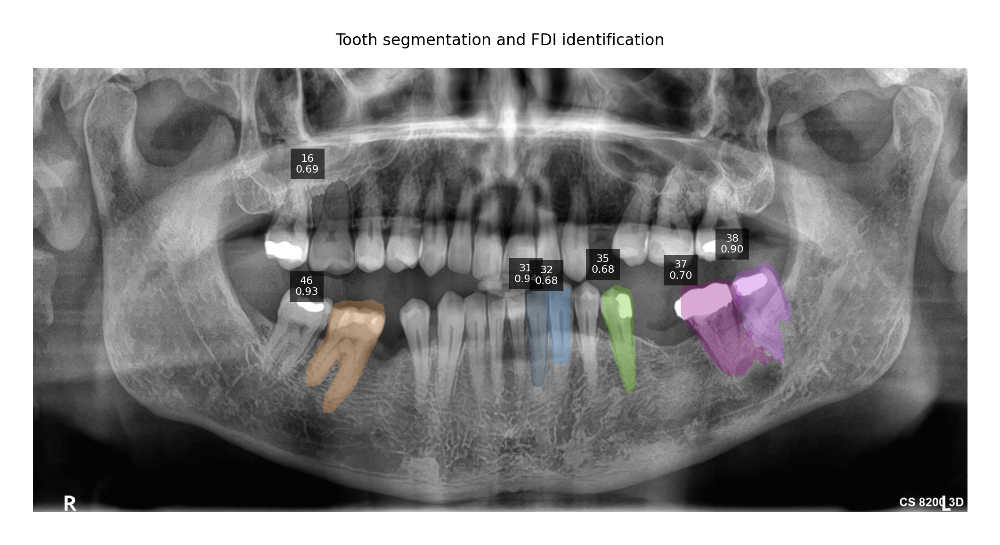


=== Running inference on 14076 (2).jpg ===
Image: 14076 (2).jpg
Predictions kept: 4
Saved overlay: outputs/predictions/uploaded/14076 (2)/14076 (2)/14076 (2)_clahe_thr0.65_display_original_prediction.png
Saved JSON: outputs/predictions/uploaded/14076 (2)/14076 (2)/14076 (2)_clahe_thr0.65_display_original_prediction.json
Saved CSV: outputs/predictions/uploaded/14076 (2)/14076 (2)/14076 (2)_clahe_thr0.65_display_original_prediction.csv
Saved report: outputs/predictions/uploaded/14076 (2)/14076 (2)/14076 (2)_clahe_thr0.65_display_original_report.md
Saved masks: outputs/predictions/uploaded/14076 (2)/14076 (2)/masks


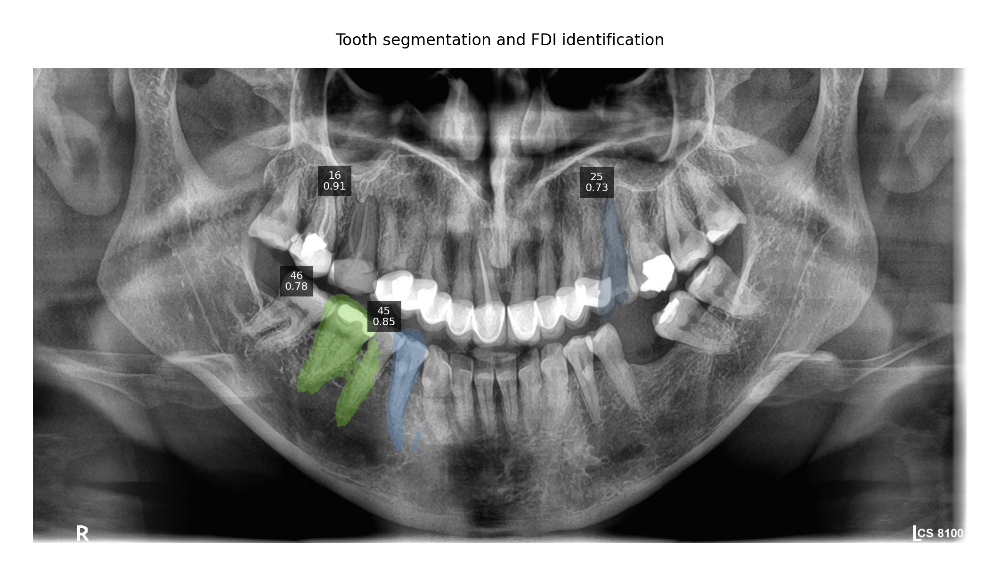

In [50]:
from google.colab import files
from IPython.display import Image, display
import os, glob

uploaded = files.upload()

for filename in uploaded.keys():
    print(f"\n=== Running inference on {filename} ===")
    out_dir = f"outputs/predictions/uploaded/{os.path.splitext(filename)[0]}"

    cmd = (
        f'PYTHONPATH=src python scripts/infer_panoramic_export.py '
        f'--image "{filename}" '
        f'--checkpoint "outputs/checkpoints/{RUN_NAME}/best_model.pth" '
        f'--output-dir "{out_dir}" '
        f'--keep-best-per-fdi --show-scores'
    )
    get_ipython().system(cmd)

    preds = sorted(glob.glob(f"{out_dir}/**/*_prediction.png", recursive=True))
    if preds:
        display(Image(filename=preds[-1]))
    else:
        print(f"No prediction image found for {filename}")

## Notes

- **This is a demo pipeline (v0.1.0), not a validated medical device** — per the repo's own warning, do not use its output as the sole basis for diagnosis or treatment.
- If you mounted Google Drive, everything under `PROJECT_ROOT` (dataset, checkpoints, logs, predictions) persists between sessions — just re-run cells 1–5 to reconnect, then skip step 6 since the data is already there.
- If Colab disconnects mid-training, re-run the training cell with `RESUME_CHECKPOINT` set to the latest `epoch_<N>.pth` under `outputs/checkpoints/<RUN_NAME>/` and the same `RUN_NAME`.
- The full README recommends 300 epochs at `--batch-size 8` for real results; that's a multi-hour-to-multi-day job even on a good GPU. The defaults above (20 epochs, batch size 4) are meant to prove the pipeline works — increase them once you've confirmed everything runs cleanly.